# Computer Vision – Exercise 1


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color
from skimage.util import random_noise
from skimage.filters import gaussian, prewitt
from skimage.morphology import erosion, disk
from scipy import ndimage


## Task 1 – Load and display the *coffee* image

Text(0.5, 1.0, 'Original – coffee')

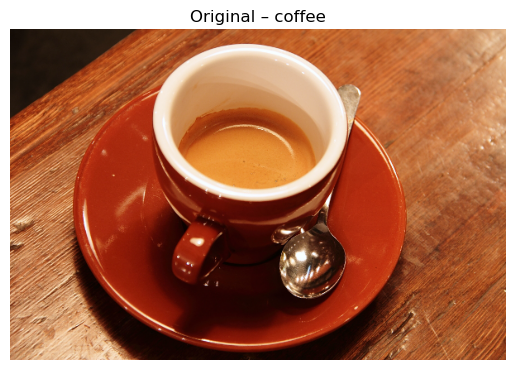

In [2]:
coffee = data.coffee()
plt.imshow(coffee)
plt.axis('off')
plt.title('Original – coffee')

## Task 2 – Add seven types of noise

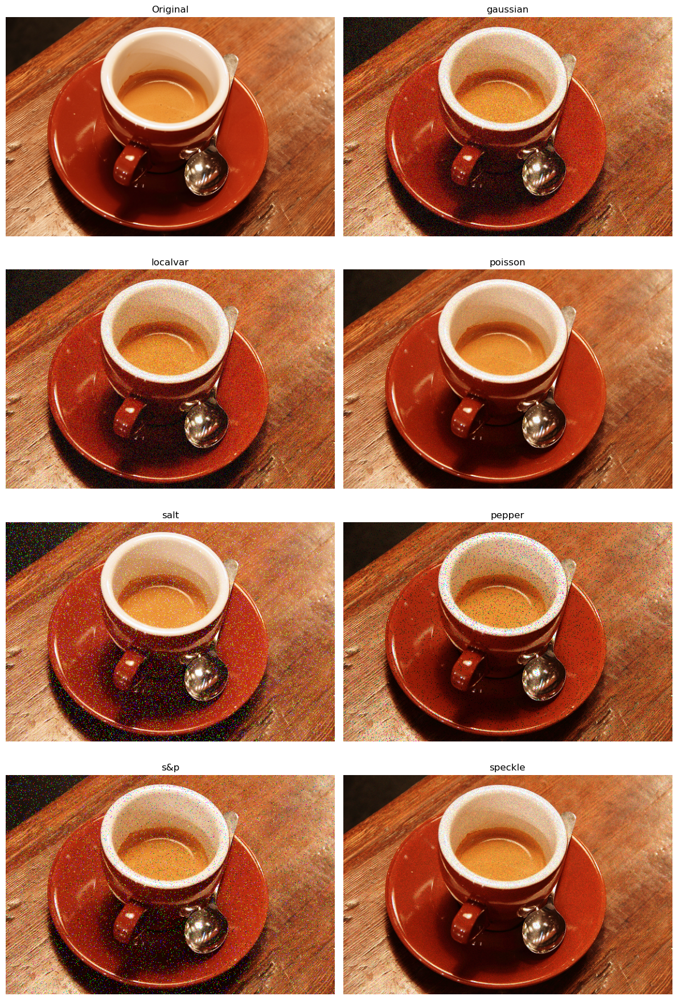

In [3]:
noise_types = ['gaussian', 'localvar', 'poisson', 'salt', 'pepper', 's&p', 'speckle']
fig, axes = plt.subplots(4, 2, figsize=(12, 18))
ax = axes.ravel()

ax[0].imshow(coffee)
ax[0].set_title('Original')
ax[0].axis('off')

for i, ntype in enumerate(noise_types, start=1):
    noisy = random_noise(coffee, mode=ntype)
    ax[i].imshow(np.clip(noisy, 0, 1))
    ax[i].set_title(ntype)
    ax[i].axis('off')

plt.tight_layout()

## Task 3 – Gaussian noise with three intensity levels

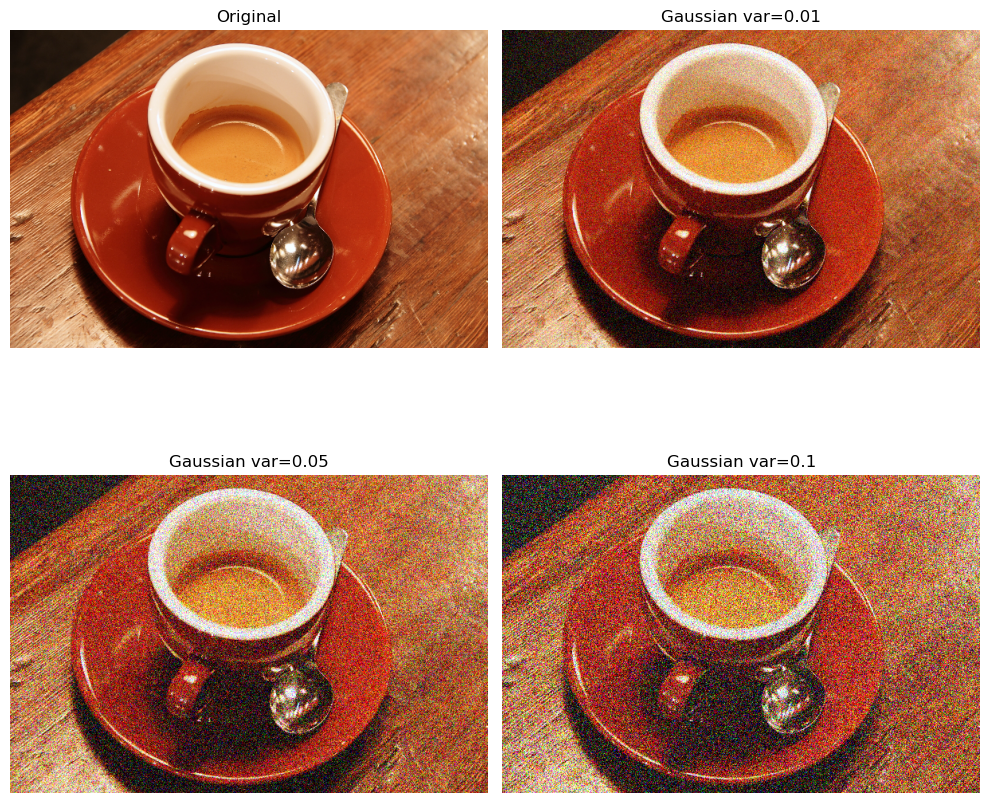

In [4]:
varsigma = [0.01, 0.05, 0.1]
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
ax = axes.ravel()
ax[0].imshow(coffee)
ax[0].set_title('Original')
ax[0].axis('off')

for i, var in enumerate(varsigma, start=1):
    gauss_noisy = random_noise(coffee, mode='gaussian', var=var)
    ax[i].imshow(gauss_noisy)
    ax[i].set_title(f'Gaussian var={var}')
    ax[i].axis('off')

plt.tight_layout()

## Task 4 – Effect of Gaussian filter `sigma` on the noisiest image

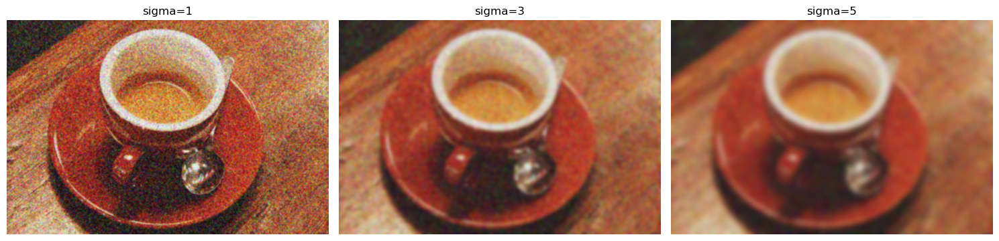

In [5]:
sigmas = [1, 3, 5]
fig, axes = plt.subplots(1, len(sigmas), figsize=(15, 5))
noisiest = random_noise(coffee, mode='gaussian', var=0.1)
for idx, s in enumerate(sigmas):
    smoothed = gaussian(noisiest, sigma=s, channel_axis=-1)
    axes[idx].imshow(smoothed)
    axes[idx].set_title(f'sigma={s}')
    axes[idx].axis('off')

plt.tight_layout()

## Task 5 – Prewitt edge detection on *bricks*

Fraction edges: 0.187
Fraction bricks (non‑edge): 0.813


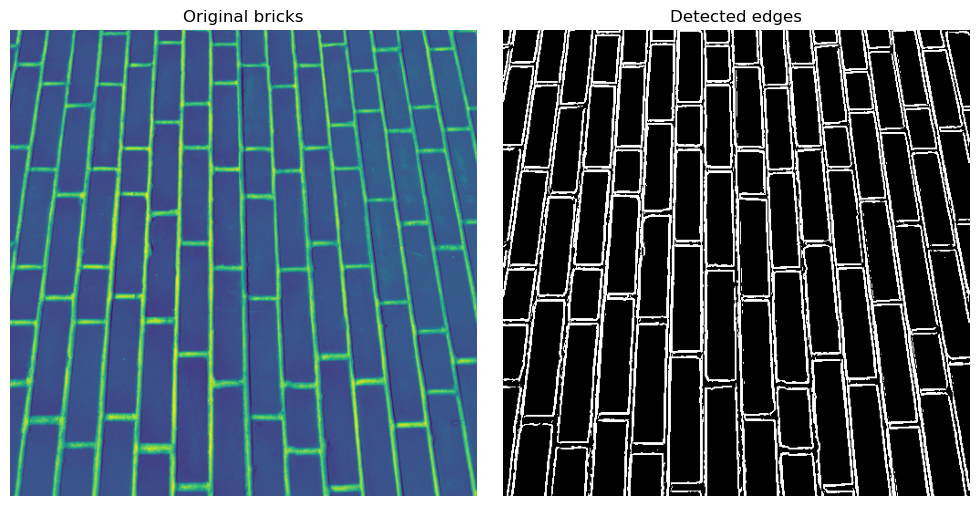

In [17]:
bricks = data.brick()

if bricks.ndim == 3:            # RGB → convert
    gray_bricks = color.rgb2gray(bricks)
else:                           # already grayscale
    gray_bricks = bricks.astype(float) / bricks.max()

# gray_bricks = color.rgb2gray(bricks)
edges = prewitt(gray_bricks)
edge_mask = edges > 0.1

fraction_edges = edge_mask.mean()
fraction_bricks = 1 - fraction_edges
print(f"Fraction edges: {fraction_edges:.3f}")
print(f"Fraction bricks (non‑edge): {fraction_bricks:.3f}")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.imshow(bricks)
ax1.set_title('Original bricks')
ax1.axis('off')

ax2.imshow(edge_mask, cmap='gray')
ax2.set_title('Detected edges')
ax2.axis('off')
plt.tight_layout()

## Task 6 – Frequency‑domain high‑pass / low‑pass filtering on *grass*

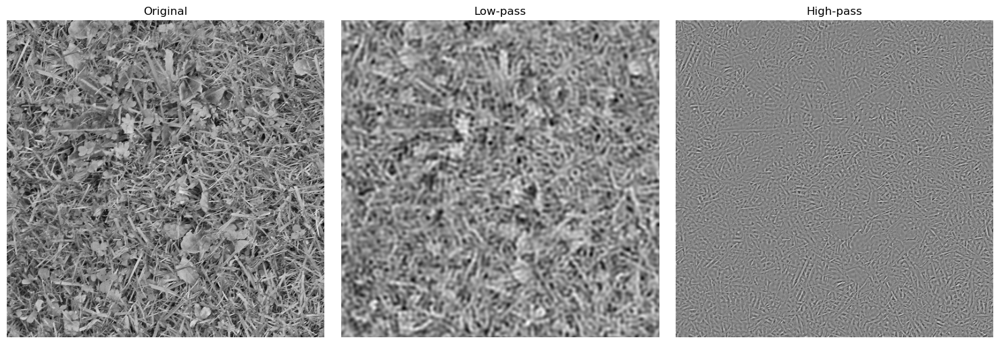

In [13]:

if data.grass().ndim == 3:
    grass = color.rgb2gray(data.grass())
else:
    grass = data.grass().astype(float) / data.grass().max()


F = np.fft.fftshift(np.fft.fft2(grass))

rows, cols = grass.shape
crow, ccol = rows//2, cols//2
radius = min(rows, cols) // 8

Y, X = np.ogrid[:rows, :cols]
dist = np.sqrt((Y - crow)**2 + (X - ccol)**2)
low_mask = dist <= radius
high_mask = ~low_mask

low_img = np.real(np.fft.ifft2(np.fft.ifftshift(F * low_mask)))
high_img = np.real(np.fft.ifft2(np.fft.ifftshift(F * high_mask)))

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(grass, cmap='gray')
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(low_img, cmap='gray')
axes[1].set_title('Low‑pass')
axes[1].axis('off')

axes[2].imshow(high_img, cmap='gray')
axes[2].set_title('High‑pass')
axes[2].axis('off')
plt.tight_layout()

## Task 7 – Morphological erosions until blobs vanish

Number of erosions required: 7


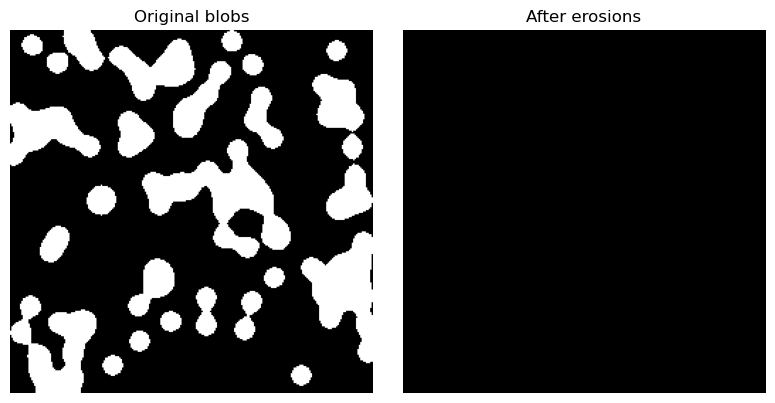

In [14]:
from skimage.data import binary_blobs
blobs = binary_blobs(length=256, blob_size_fraction=0.1, volume_fraction=0.3)
selem = disk(3)
eroded = blobs.copy()
iterations = 0
while eroded.any():
    eroded = erosion(eroded, selem)
    iterations += 1

print(f'Number of erosions required: {iterations}')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
ax1.imshow(blobs, cmap='gray')
ax1.set_title('Original blobs')
ax1.axis('off')

ax2.imshow(eroded, cmap='gray')
ax2.set_title('After erosions')
ax2.axis('off')
plt.tight_layout()